In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import tensorflow as tf

In [3]:
content_path = tf.keras.utils.get_file("turtle.jpeg", "https://imgs.search.brave.com/coM1xjP3nWP2VZEE3_ctVo2N5bBA_J1HqGuFw2bMQog/rs:fit:860:0:0:0/g:ce/aHR0cHM6Ly9tZWRp/YTEudGhyaWxsb3Bo/aWxpYS5jb20vZmls/ZXN0b3JlL2h3MnFo/MW9nbzhlYTc5djk0/cW9yazNvZTkzZTJf/MTQ2NzcxNTY1NF8z/MTEzMzYyMDBfMzY4/MGFmMzBkNV9vLmpw/Zz93PTE0NDAmZHBy/PTI")
style_path = tf.keras.utils.get_file("temeraire.jpg", "https://www.nationalgallery.org.uk/media/32555/n-0524-00-000050-hd.jpg?rmode=max&width=1500&height=1080&quality=85")

60936/60936 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
239372/239372 ━━━━━━━━━━━━━━━━━━━━ 2s 9us/step 


# Preprocess and load images

In [4]:
import matplotlib.pyplot as plt


def load_img(img_path, max_dim=512):
    try:
        img = tf.io.read_file(img_path)
        img = tf.image.decode_image(img, channels=3)
        img = tf.image.convert_image_dtype(img, tf.float32)
    except Exception as e:
        raise ValueError(f"Error loading image from path {img_path}: {e}")

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img


def show_img(image, title=None):
    try:
        if len(image.shape) > 3:
            image = tf.squeeze(image, axis=0)
    except Exception as e:
        raise ValueError(f"Error processing image tensor: {e}")

    plt.imshow(image)
    if title:
        plt.title(title)

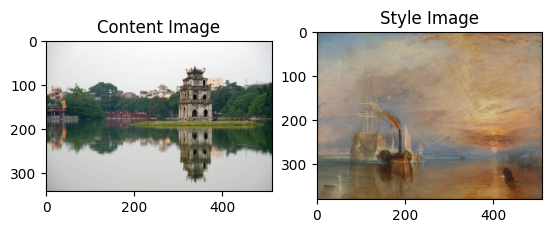

In [5]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
show_img(content_image, 'Content Image')

plt.subplot(1, 2, 2)
show_img(style_image, 'Style Image')

# Construct the transference

## Load the CONV layers from VGG19

In [6]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

for layer in vgg.layers:
    print(layer.name)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
input_layer
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [7]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [8]:
def vgg_layers(layer_names):
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    
    outputs = [vgg.get_layer(name).output for name in layer_names]
    
    model = tf.keras.Model([vgg.input], outputs)
    return model

In [9]:
style_extractor = vgg_layers(style_layers)

In [10]:
style_outputs = style_extractor(style_image*255)

## Construct loss function

In [11]:
def gram_matrix(input_tensor):
    shape = tf.shape(input_tensor)
    b, h, w, c = shape[0], shape[1], shape[2], shape[3]
    features = tf.reshape(input_tensor, [b, h*w, c])

    gram = tf.matmul(features, features, transpose_a=True)

    return gram / tf.cast(h*w, tf.float32)

In [12]:
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False
    
    def call(self, inputs):
        inputs = inputs*255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])
        
        style_outputs = [gram_matrix(style_output)
                         for style_output in style_outputs]
        
        content_dict = {content_name: value
                        for content_name, value
                        in zip(self.content_layers, content_outputs)}
        
        style_dict = {style_name: value
                      for style_name, value
                      in zip(self.style_layers, style_outputs)}
        
        return {'content': content_dict, 'style': style_dict}

In [13]:
extractor = StyleContentModel(style_layers, content_layers)

In [14]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [15]:
image = tf.Variable(content_image)

In [16]:
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [17]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.99, epsilon=1e-1)

In [18]:
style_weight, content_weight = 1e-2, 1e4

In [19]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    
    loss = style_loss + content_loss
    
    return loss

In [20]:
total_variation_weight = 35

## Transference

In [21]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight*tf.image.total_variation(image)
        
    grad = tape.gradient(loss, image)
    optimizer.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

In [22]:
import PIL

def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]

    return PIL.Image.fromarray(tensor)

In [23]:
import time
from tqdm import tqdm
import IPython.display as display

start = time.time()

epochs = 2000
steps_per_epoch = 100

step = 0
images = []

for n in range(epochs):
    with tqdm(total=steps_per_epoch, desc=f"Epoch {n+1}/{epochs}", unit="step") as pbar:
        for m in range(steps_per_epoch):
            step += 1
            train_step(image)
            pbar.update(1)
    images.append(tensor_to_image(image))

end = time.time()
print("Total time: {:.1f}".format(end-start))

Epoch 2000/2000: 100%|██████████| 100/100 [00:06<00:00, 15.44step/s]


Total time: 13482.5


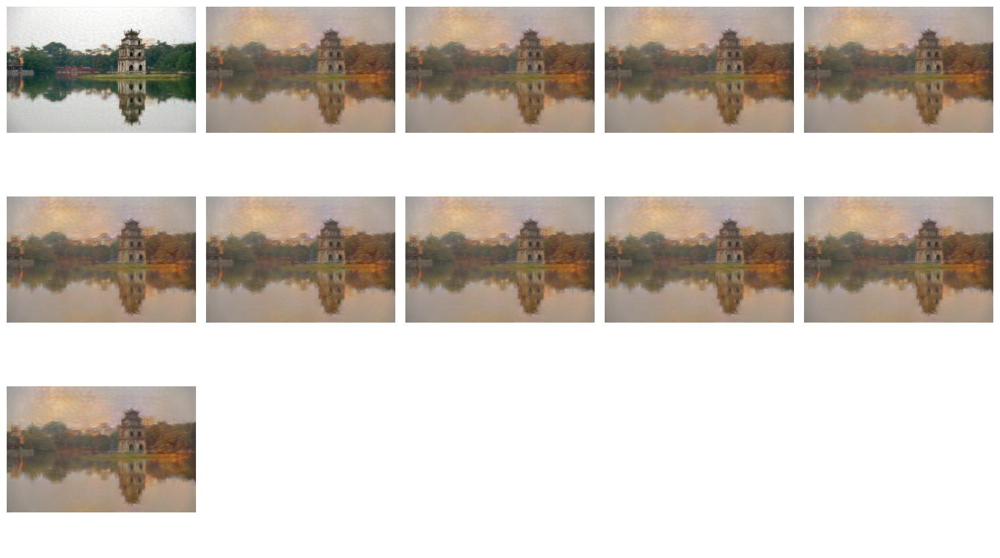

In [24]:
import matplotlib.pyplot as plt

selected_images = [images[i] for i in range(0, epochs, epochs // 10)]
selected_images.append(images[-1])

num_images = len(selected_images)

fig, axes = plt.subplots(nrows=(num_images // 5) + (num_images % 5 > 0), ncols=5, figsize=(15, 3 * ((num_images // 5) + (num_images % 5 > 0))))

axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < num_images:
        ax.imshow(selected_images[i])
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

Lastly, let's have some observation on the VGG Layers extracted features from the style target

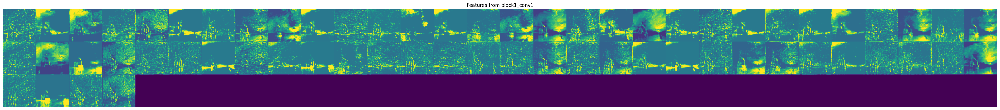

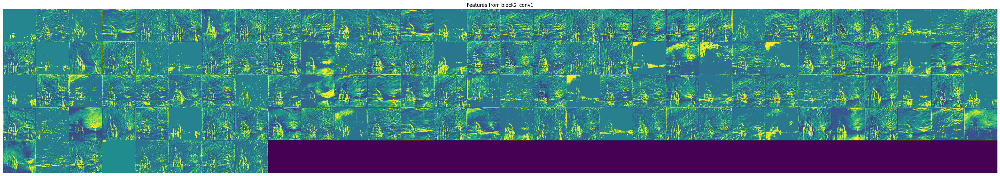

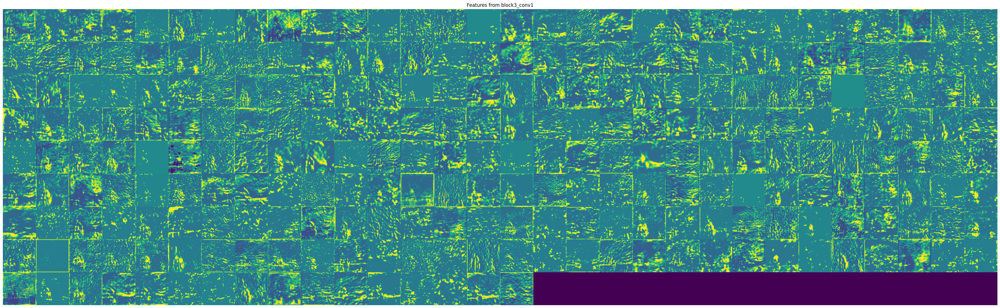

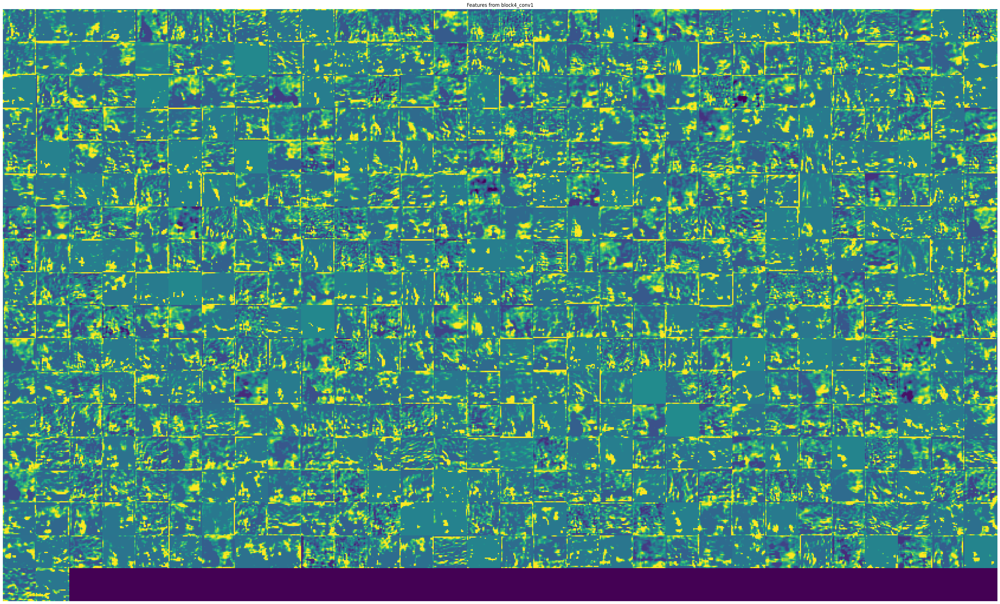

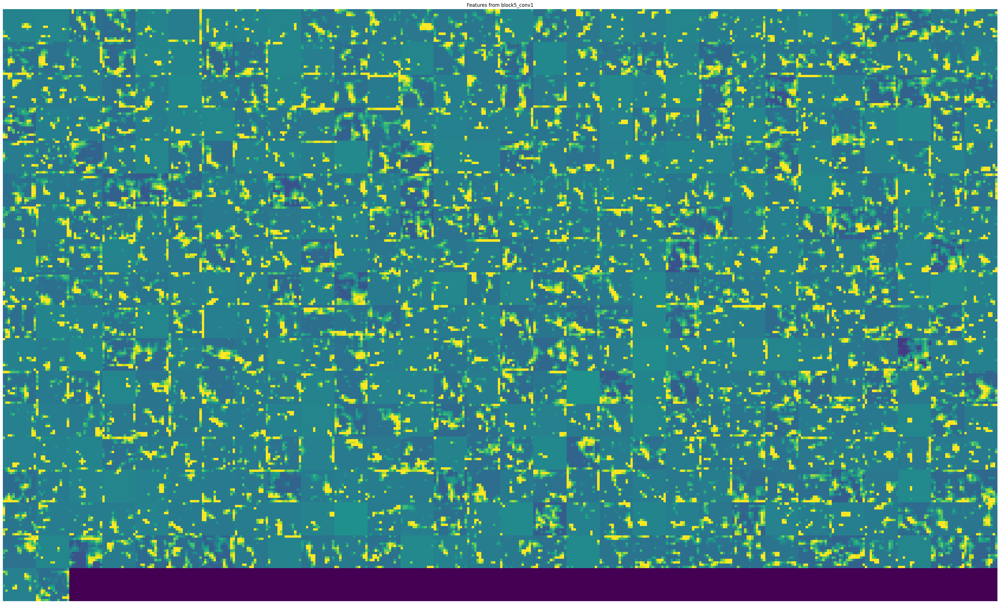

In [25]:
style_image = tf.keras.preprocessing.image.load_img(style_path)
style_image = tf.keras.preprocessing.image.img_to_array(style_image)
style_image = tf.image.resize(style_image, (224, 224))
style_image = tf.keras.applications.vgg19.preprocess_input(style_image)
style_image = tf.expand_dims(style_image, axis=0)

style_outputs = style_extractor(style_image)

for i, style_output in enumerate(style_outputs):
    num_filters = style_output.shape[-1]
    size = style_output.shape[1]
    num_cols = 30
    num_rows = num_filters // num_cols + (num_filters % num_cols != 0)
    display_grid = np.zeros((size * num_rows, size * num_cols))

    for j in range(num_filters):
        row = j // num_cols
        col = j % num_cols
        x = style_output[0, :, :, j].numpy()
        x -= x.mean()
        x /= (x.std() + 1e-5)
        x *= 64
        x += 128
        x = np.clip(x, 0, 255).astype('uint8')
        display_grid[row * size : (row + 1) * size, col * size : (col + 1) * size] = x

    scale = 1.5
    plt.figure(figsize=(scale * num_cols, scale * num_rows))
    plt.title(f'Features from {style_layers[i]}')
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.axis('off')
    plt.show()